Import statments

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import time

Function to read image

In [2]:
def read_image(image_path, mode=1):
    image = cv2.imread(image_path,mode)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

Function to write image to a specified path

In [3]:
def write_image(image, output_path):

    if len(image.shape) == 2:
      cv2.imwrite(output_path, image)
    elif len(image.shape) == 3 and image.shape[2] == 3:
      cv2.imwrite(output_path, image)
    else:
        raise ValueError("Image shape is incorrect")

Function to display image

In [4]:
def display_image(image, mode=1):
    if image.dtype == np.float64 or image.dtype == np.float32:
        image = np.clip(image, 0, 255)
        image = image.astype(np.uint8)
    if mode == 1:
      image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      plt.imshow(image_rgb)
    else:
      plt.imshow(image, cmap='gray')

Function to resize image

In [5]:
def resize_image(image, width, height):
  if len(image.shape) == 3:
    resized_image = np.zeros((height, width, 3), dtype=np.uint8)
  else:
    resized_image = np.zeros((height, width), dtype=np.uint8)

  h, w = image.shape[:2]
  x_scale = w / width
  y_scale = h / height

  for y in range(height):
    for x in range(width):
      original_x = int(x * x_scale)
      original_y = int(y * y_scale)
      resized_image[y, x] = image[original_y, original_x]

  return resized_image

Function to plot two images

In [67]:
def plot_two_images(img1, img2, title1="Image 1", title2="Image 2"):
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    if img1.ndim == 2:
        plt.imshow(img1, cmap='gray')
    else:
        img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
        plt.imshow(img1_rgb)
    plt.title(title1)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    if img2.ndim == 2:
        plt.imshow(img2, cmap='gray')
    else:
        img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
        plt.imshow(img2_rgb)
    plt.title(title2)
    plt.axis('off')

    plt.show()

**Question 1: Let's Get Blurry**

Reading IMG1

In [22]:
img1_path = '/content/IMG1.jpg'
img1 = read_image(img1_path)

**1.1: conv2D Function**

In [34]:
def conv2D(img, kernel):
    img_copy = np.copy(img)
    img_height, img_width = img_copy.shape
    k_height, k_width = kernel.shape
    pad_height = k_height // 2
    pad_width = k_width // 2
    padded_img = np.pad(img_copy, ((pad_height, pad_height), (pad_width, pad_width)), mode='constant', constant_values=0)
    output = np.zeros_like(img_copy)

    for i in range(img_height):
        for j in range(img_width):
            region = padded_img[i:i + k_height, j:j + k_width]
            output[i, j] = np.sum(region * kernel)

    return output

**1.2: MeanFilter**





In [30]:
def meanFilter(img, k=5):
    img_copy = np.copy(img)
    kernel = np.ones((k, k), dtype=np.float32) / (k * k)

    if img_copy.ndim == 3:
        filtered_image = np.zeros_like(img)
        for i in range(img_copy.shape[2]):
            filtered_image[:, :, i] = conv2D(img_copy[:, :, i], kernel)
    else:
        filtered_image = conv2D(img_copy, kernel)

    return filtered_image

In [25]:
mean_filtered_image = meanFilter(img1, k=5)

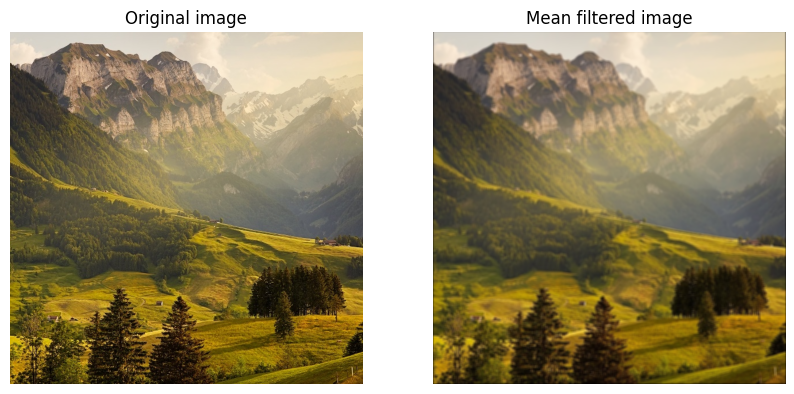

In [26]:
plot_two_images(img1, mean_filtered_image, title1='Original image', title2='Mean filtered image')

**1.3: Median Filter**

In [31]:
def apply_median_filter_2D(img, k):
    img_copy = np.copy(img)
    h, w = img_copy.shape
    pad_size = k // 2
    padded_img = np.pad(img_copy, pad_size, mode='constant', constant_values=0)
    filtered_img = np.zeros_like(img_copy)
    for i in range(h):
        for j in range(w):
            window = padded_img[i:i+k, j:j+k]
            median_value = np.median(window)
            filtered_img[i, j] = median_value

    return filtered_img

In [32]:
def medianFilter(img, k=5):
    img_copy = np.copy(img)
    if k % 2 == 0:
        raise ValueError("Kernel size must be odd")
    if img_copy.ndim == 2:
        return apply_median_filter_2D(img_copy, k)
    else:
        h, w, c = img_copy.shape
        filtered_img = np.zeros_like(img_copy)
        for channel in range(c):
            filtered_img[:, :, channel] = apply_median_filter_2D(img_copy[:, :, channel], k)
        return filtered_img

In [29]:
median_filtered_image = medianFilter(img1, k=5)

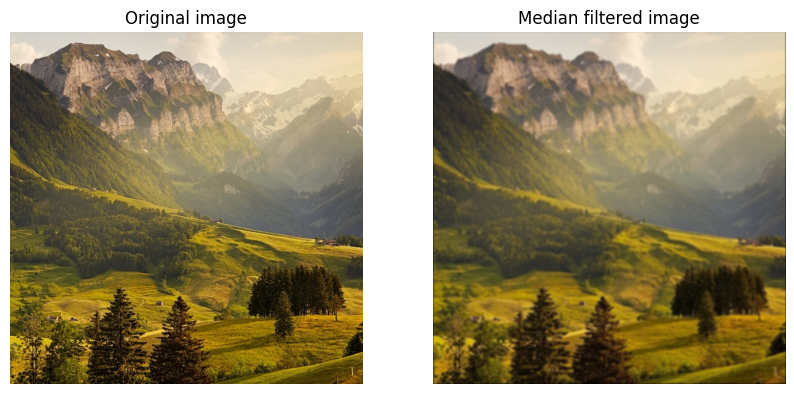

In [16]:
plot_two_images(img1, mean_filtered_image, title1='Original image', title2='Median filtered image')


**1.4: Time Analysis**

In [91]:
def measure_time_for_mean_and_median_filters(image, kernel_sizes):
    mean_times = []
    median_times = []

    for k in kernel_sizes:
        start_time = time.time()
        meanFilter(image, k)
        mean_times.append(time.time() - start_time)

        start_time = time.time()
        medianFilter(image, k)
        median_times.append(time.time() - start_time)

    return mean_times, median_times

In [92]:
image_sizes = [(256, 256), (512, 512), (1024, 1024)]
kernel_sizes = [3, 5, 7]

mean_times_all = []
median_times_all = []

for size in image_sizes:
    resized_img = resize_image(img1, size[0], size[1])
    mean_times, median_times = measure_time_for_mean_and_median_filters(resized_img, kernel_sizes)
    mean_times_all.append(mean_times)
    median_times_all.append(median_times)

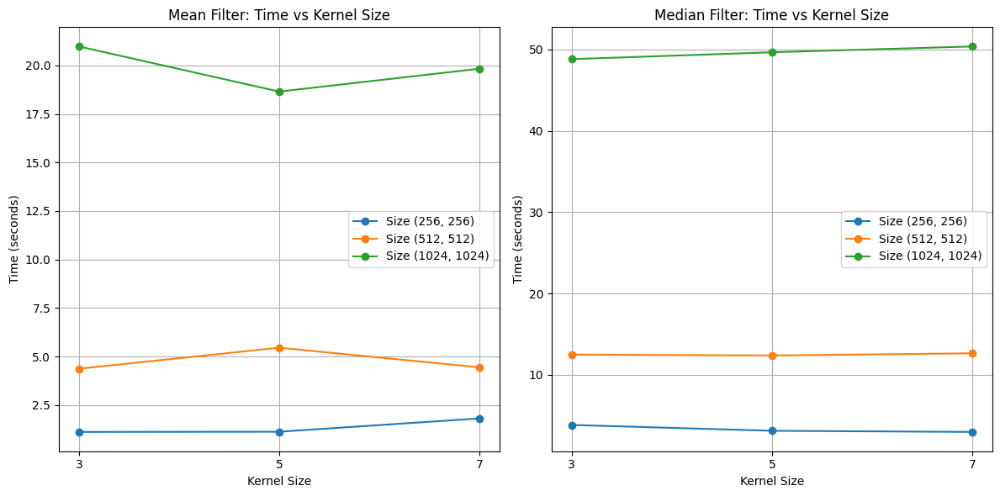

In [93]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
for i, size in enumerate(image_sizes):
    plt.plot(kernel_sizes, mean_times_all[i], marker='o', label=f'Size {size}')
plt.title('Mean Filter: Time vs Kernel Size')
plt.xlabel('Kernel Size')
plt.ylabel('Time (seconds)')
plt.xticks(kernel_sizes)
plt.legend()
plt.grid()

plt.subplot(1, 2, 2)
for i, size in enumerate(image_sizes):
    plt.plot(kernel_sizes, median_times_all[i], marker='o', label=f'Size {size}')
plt.title('Median Filter: Time vs Kernel Size')
plt.xlabel('Kernel Size')
plt.ylabel('Time (seconds)')
plt.xticks(kernel_sizes)
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()

**Observations:**

**Execution Time and Kernel Size:** Generally, you will observe that the execution time increases with the kernel size, especially for larger images. This is because larger kernels involve more computations.

However, there could be specific scenarios where a larger kernel might appear to take less time due to external factors:

**Optimized Libraries:** If you are using an optimized library (e.g., OpenCV, NumPy, or others), some implementations may be more efficient for certain kernel sizes depending on how the computation is parallelized or vectorized under the hood. For instance, some libraries may optimize better for powers of 2 or specific sizes.

**Caching Effects:** If the image fits into the cache of the processor, the performance difference may become less pronounced. For some kernels, the memory access patterns may be more cache-efficient, giving the appearance of faster execution.

**Overhead:** In some edge cases, the overhead of function calls, memory management, or other operations might mask the difference between two kernel sizes, especially on smaller images where the computational load isn't very large to begin with.

**Comparison of Filters:** The mean filter may be faster than the median filter for the same kernel size due to the nature of the operations involved. The median filter is typically more computationally intensive as it requires sorting the pixel values.

**Image Dimensions:** As the image dimensions increase, the execution time for both filters tends to increase significantly, demonstrating the importance of image size in performance considerations.

**1.5: Fast Mean Filter**

In [14]:
def fast_conv2D(img, kernel):
    img_copy = np.copy(img)
    img_height, img_width = img_copy.shape
    k_height, k_width = kernel.shape
    pad_height = k_height // 2
    pad_width = k_width // 2
    padded_img = np.pad(img_copy, ((pad_height, pad_height), (pad_width, pad_width)), mode='constant')

    view_shape = (img_height, img_width, k_height, k_width)
    strides = (padded_img.strides[0], padded_img.strides[1], padded_img.strides[0], padded_img.strides[1])
    windows = np.lib.stride_tricks.as_strided(padded_img, shape=view_shape, strides=strides)

    output = np.tensordot(windows, kernel, axes=((2, 3), (0, 1)))

    return output

In [95]:
def fastMeanFilter(img, k=5):
    img_copy = np.copy(img)
    kernel = np.ones((k, k), dtype=np.float32) / (k * k)

    if img_copy.ndim == 3:
        filtered_image = np.zeros_like(img)
        for i in range(img_copy.shape[2]):
            filtered_image[:, :, i] = fast_conv2D(img_copy[:, :, i], kernel)
    else:
        filtered_image = fast_conv2D(img_copy, kernel)

    return filtered_image

In [96]:
def measure_time_for_mean_and_fastmean_filters(image, kernel_sizes):
    mean_times = []
    fast_mean_times = []

    for k in kernel_sizes:
        start_time = time.time()
        meanFilter(image, k)
        mean_times.append(time.time() - start_time)

        start_time = time.time()
        fastMeanFilter(image, k)
        fast_mean_times.append(time.time() - start_time)

    return mean_times, fast_mean_times

In [97]:
image_sizes = [(256, 256), (512, 512), (1024, 1024)]
kernel_sizes = [3, 5, 7]

mean_times_all = []
fast_mean_times_all = []

for size in image_sizes:
    resized_img = resize_image(img1, size[0], size[1])
    mean_times, fast_mean_times = measure_time_for_mean_and_fastmean_filters(resized_img, kernel_sizes)
    mean_times_all.append(mean_times)
    fast_mean_times_all.append(fast_mean_times)

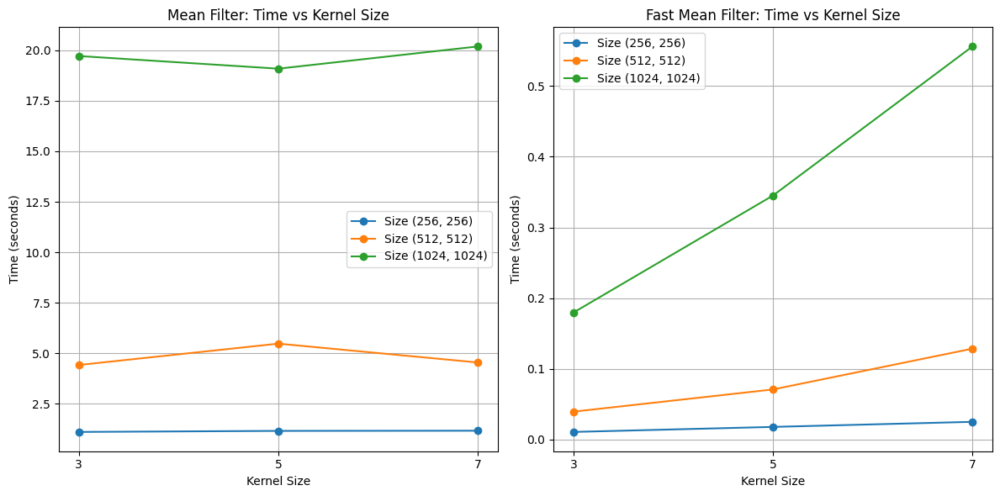

In [98]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
for i, size in enumerate(image_sizes):
    plt.plot(kernel_sizes, mean_times_all[i], marker='o', label=f'Size {size}')
plt.title('Mean Filter: Time vs Kernel Size')
plt.xlabel('Kernel Size')
plt.ylabel('Time (seconds)')
plt.xticks(kernel_sizes)
plt.legend()
plt.grid()

plt.subplot(1, 2, 2)
for i, size in enumerate(image_sizes):
    plt.plot(kernel_sizes, fast_mean_times_all[i], marker='o', label=f'Size {size}')
plt.title('Fast Mean Filter: Time vs Kernel Size')
plt.xlabel('Kernel Size')
plt.ylabel('Time (seconds)')
plt.xticks(kernel_sizes)
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()

**Question 2: Distribution is the Solution**

**2.1: Gaussian Filter**

In [36]:
img2_path = '/content/IMG2.jpg'
img2 = read_image(img2_path)

In [37]:
def gaussian_kernel(k, sigma):
  ax = np.linspace(-(k - 1) // 2, (k - 1) // 2, k)
  xx, yy = np.meshgrid(ax, ax)
  kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))
  kernel /= np.sum(kernel)
  return kernel

In [38]:
def gaussFilter(img, k=7, sigma=1.0):
    img_copy = np.copy(img)
    kernel = gaussian_kernel(k, sigma)
    if img_copy.ndim == 3:
        filtered_image = np.zeros_like(img_copy)
        for i in range(img_copy.shape[2]):
            filtered_image[:, :, i] = fast_conv2D(img_copy[:, :, i], kernel)
    else:
        filtered_image = fast_conv2D(img_copy, kernel)

    return filtered_image

In [39]:
gaussian_filtered_img = gaussFilter(img2, k=7, sigma=1.0)

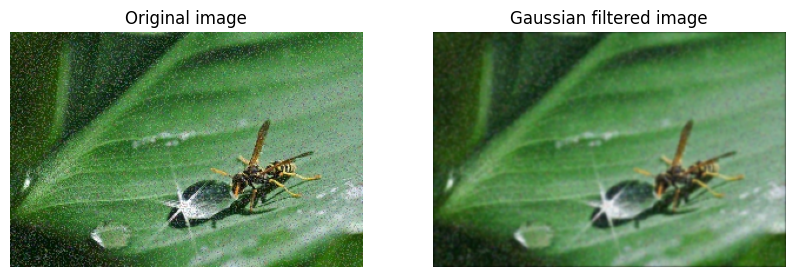

In [40]:
plot_two_images(img2, gaussian_filtered_img, title1='Original image', title2='Gaussian filtered image')

**2.2: Results for different value of sigma**

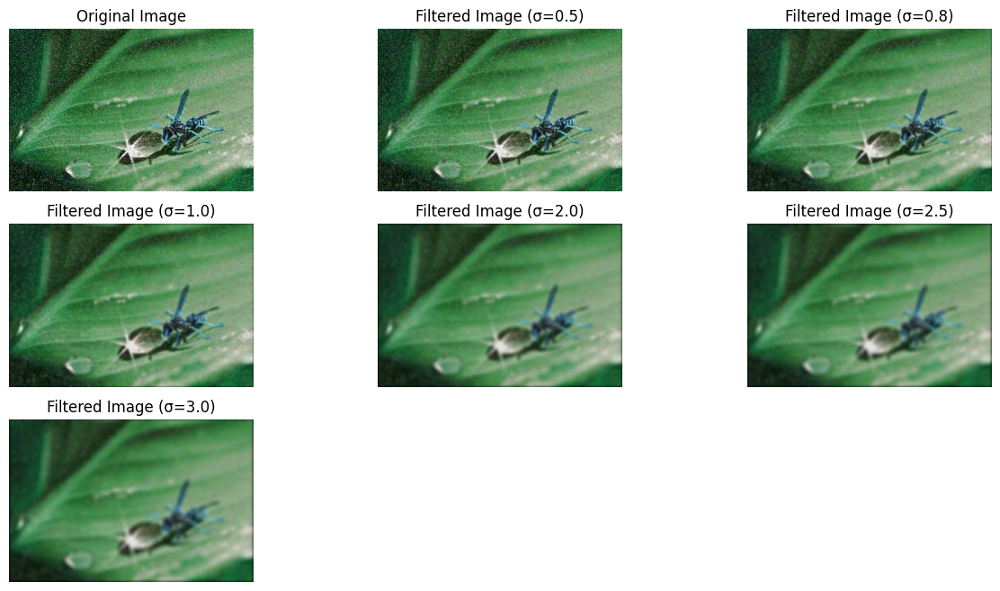

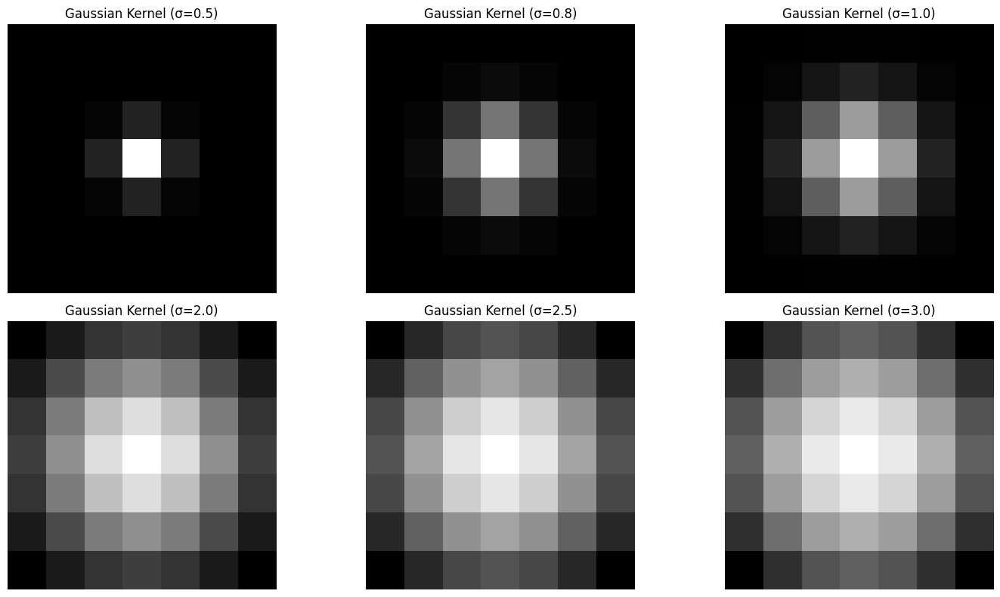

In [104]:
sigma_values = [0.5, 0.8, 1.0, 2.0, 2.5, 3.0]
filtered_images = []

plt.figure(figsize=(15, 8))

plt.subplot(3, 3, 1)
plt.imshow(img2, cmap='gray')
plt.title('Original Image')
plt.axis('off')

for i, sigma in enumerate(sigma_values):
    filtered_img = gaussFilter(img2, k=7, sigma=sigma)
    filtered_images.append(filtered_img)

    plt.subplot(3, 3, i + 2)
    plt.imshow(filtered_img, cmap='gray')
    plt.title(f'Filtered Image (σ={sigma})')
    plt.axis('off')

plt.figure(figsize=(15, 8))
for i, sigma in enumerate(sigma_values):
    ax = np.linspace(-(7 - 1) // 2, (7 - 1) // 2, 7)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))
    kernel /= np.sum(kernel)
    plt.subplot(2, 3, i + 1)
    plt.imshow(kernel, cmap='gray')
    plt.title(f'Gaussian Kernel (σ={sigma})')
    plt.axis('off')

plt.tight_layout()
plt.show()

**Gaussian Kernel Distribution for different σ**

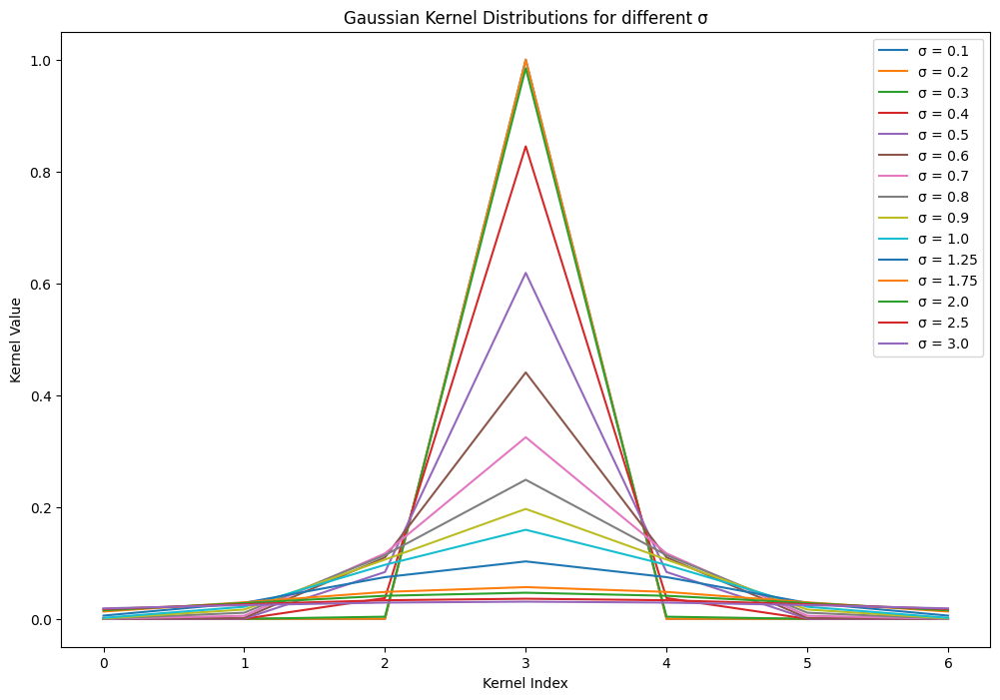

In [105]:
sigma_values = [0.1,0.2,0.3,0.4,0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.25, 1.75 , 2.0,2.5,3.0]
plt.figure(figsize=(12, 8))
for sigma in sigma_values:
    kernel = gaussian_kernel(7, sigma)
    plt.plot(kernel[3], label=f'σ = {sigma}')

plt.title('Gaussian Kernel Distributions for different σ')
plt.xlabel('Kernel Index')
plt.ylabel('Kernel Value')
plt.legend()
plt.show()

**2.3: Results on optimal sigma with varying kernel**

In [106]:
sigma_optimal = 0.8
kernel_sizes = [5, 11, 19]

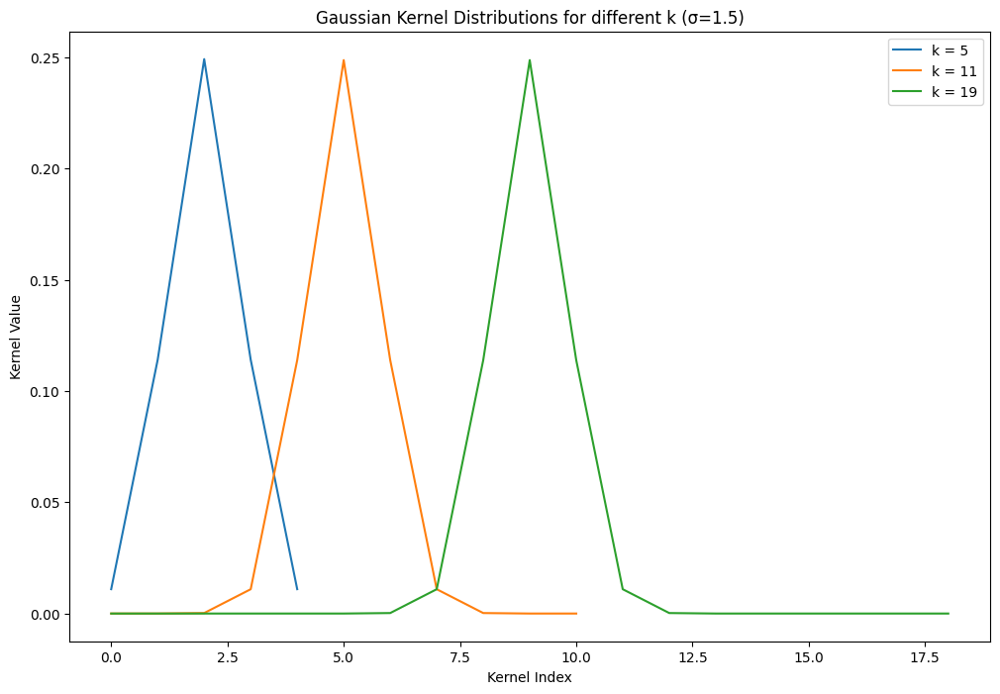

In [107]:
plt.figure(figsize=(12, 8))
for k in kernel_sizes:
    kernel = gaussian_kernel(k, sigma_optimal)
    plt.plot(kernel[k//2], label=f'k = {k}')

plt.title('Gaussian Kernel Distributions for different k (σ=1.5)')
plt.xlabel('Kernel Index')
plt.ylabel('Kernel Value')
plt.legend()
plt.show()

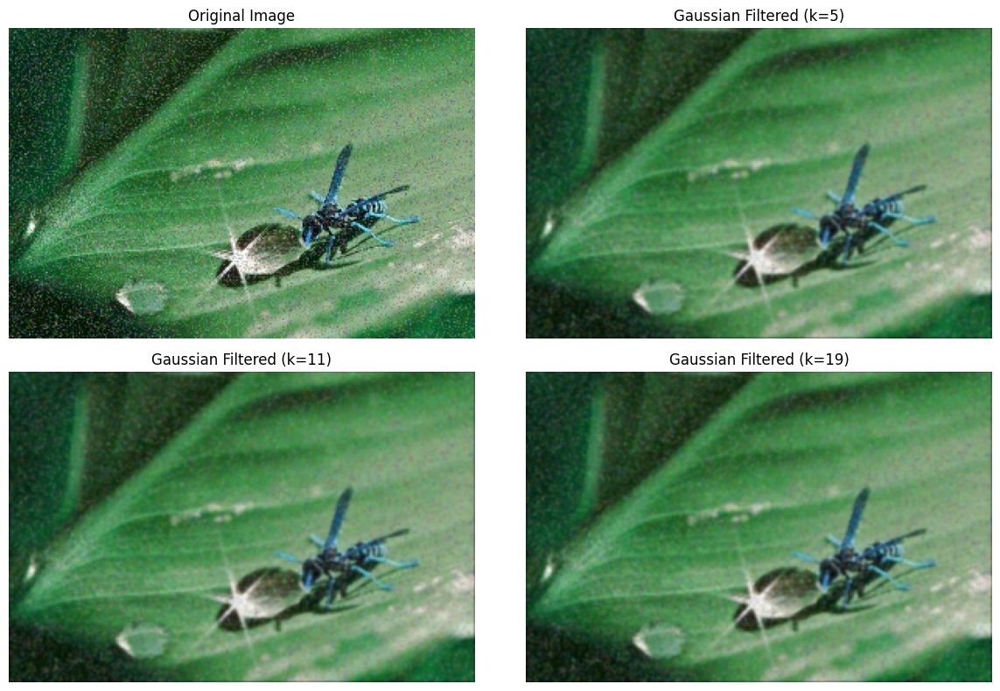

In [108]:
filtered_images = []

for k in kernel_sizes:
    filtered_img = gaussFilter(img2, k=k, sigma=sigma_optimal)
    filtered_images.append(filtered_img)

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.imshow(img2)
plt.title('Original Image')
plt.axis('off')

for i, filtered_img in enumerate(filtered_images):
    plt.subplot(2, 2, i + 2)
    plt.imshow(filtered_img)
    plt.title(f'Gaussian Filtered (k={kernel_sizes[i]})')
    plt.axis('off')

plt.tight_layout()
plt.show()

In [109]:
gaussian_filtered_imgs = []

for k in kernel_sizes:
    filtered_img = gaussFilter(img2, k=k, sigma=sigma_optimal)
    gaussian_filtered_imgs.append(filtered_img)

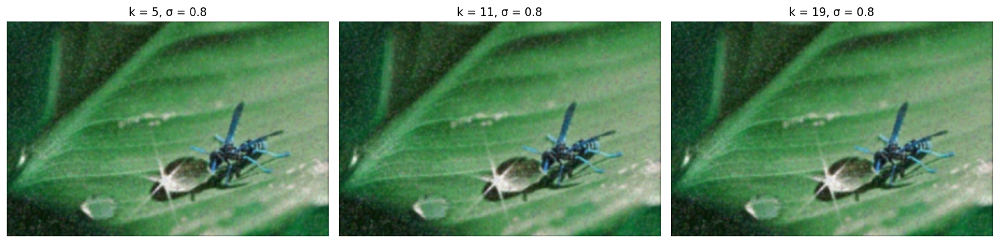

In [110]:
plt.figure(figsize=(15, 8))
for i, k in enumerate(kernel_sizes):
    plt.subplot(1, len(kernel_sizes), i+1)
    plt.title(f'k = {k}, σ = {sigma_optimal}')
    plt.imshow(gaussian_filtered_imgs[i])
    plt.axis('off')

plt.tight_layout()
plt.show()

**Observations:**

**Effect of Kernel Size:**

**Small Kernel (k=3):** The filtered image retains more details and sharpness. It effectively smooths minor noise while preserving edges. However, it might not significantly reduce larger noise patterns.

**Medium Kernel (k=5):** This kernel size balances detail preservation and noise reduction. The image appears smoother, with some details softened, but major structures remain clear.

**Large Kernel (k=7):** The filtered image shows a significant reduction in noise, but details are lost as the smoothing effect increases. Important features may become blurred, especially fine textures.
Impact of Constant Sigma (σ):

Keeping σ constant while varying k allows us to observe the influence of kernel size on the Gaussian filter's behavior. A larger kernel size generally leads to stronger smoothing effects, as the filter averages over a larger neighborhood, affecting more pixels.
The value of σ (which controls the spread of the Gaussian distribution) influences the extent of smoothing. Even with a larger k, a higher σ will result in more blurring. Conversely, a lower σ will preserve more details.

**Trade-off:** There is a trade-off between noise reduction and detail preservation. The choice of kernel size should depend on the specific application needs—whether one prioritizes a clearer image or a noise-free image.

**2.4: Bilateral Filter**

In [42]:
def bilaterFilter(img, k=7, sigma_s=1.0, sigma_r=1.0):
    img_copy = np.copy(img)
    pad_size = k // 2
    img_height, img_width = img_copy.shape[:2]

    ax = np.linspace(-pad_size, pad_size, k)
    xx, yy = np.meshgrid(ax, ax)
    spatial_kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma_s**2))

    filtered_image = np.zeros_like(img_copy)

    for i in range(img_height):
        for j in range(img_width):
            i_min = max(i - pad_size, 0)
            i_max = min(i + pad_size + 1, img_height)
            j_min = max(j - pad_size, 0)
            j_max = min(j + pad_size + 1, img_width)

            region = img_copy[i_min:i_max, j_min:j_max]

            if img_copy.ndim == 3:
                filtered_value = np.zeros(img_copy.shape[2])

                for channel in range(img_copy.shape[2]):
                    intensity_diff = region[:, :, channel] - img_copy[i, j, channel]
                    intensity_kernel = np.exp(-(intensity_diff ** 2) / (2 * sigma_r**2))

                    combined_kernel = spatial_kernel[pad_size - (i - i_min):pad_size + (i_max - i),
                                                      pad_size - (j - j_min):pad_size + (j_max - j)] * intensity_kernel

                    combined_kernel /= np.sum(combined_kernel)
                    filtered_value[channel] = np.sum(combined_kernel * region[:, :, channel])

                filtered_image[i, j] = filtered_value

            else:
                intensity_diff = region - img_copy[i, j]
                intensity_kernel = np.exp(-(intensity_diff ** 2) / (2 * sigma_r**2))
                combined_kernel = spatial_kernel[pad_size - (i - i_min):pad_size + (i_max - i),
                                                  pad_size - (j - j_min):pad_size + (j_max - j)] * intensity_kernel
                combined_kernel /= np.sum(combined_kernel)
                filtered_image[i, j] = np.sum(combined_kernel * region)

    return filtered_image

In [112]:
k = 7
sigma_s = 1.0
sigma_r = 1.0
bilateral_filtered_img = bilaterFilter(img2, k, sigma_s, sigma_r)

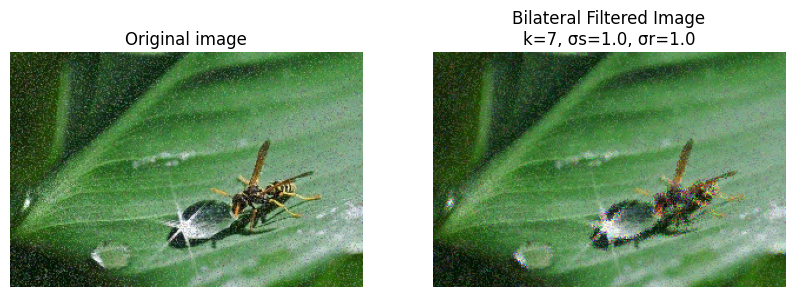

In [113]:
plot_two_images(img2, bilateral_filtered_img, title1='Original image', title2=f'Bilateral Filtered Image\nk={k}, σs={sigma_s}, σr={sigma_r}')

**2.5: Results on different values of k, sigma_s and sigma_r**

In [114]:
def plot_images(images, titles, ncols=3):
    n_images = len(images)
    n_rows = (n_images + ncols - 1) // ncols
    plt.figure(figsize=(15, 5 * n_rows))
    for i in range(n_images):
        plt.subplot(n_rows, ncols, i + 1)
        plt.imshow(images[i], cmap='gray' if images[i].ndim == 2 else None)
        plt.title(titles[i])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

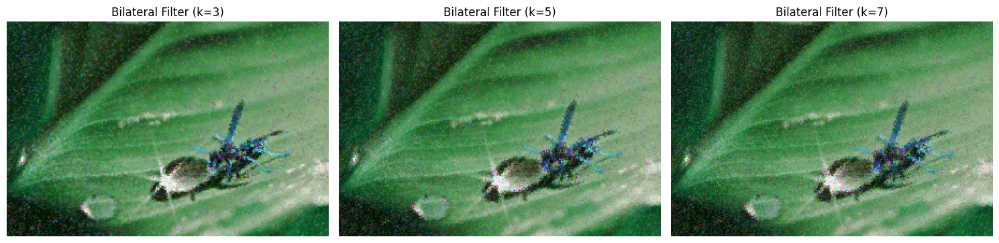

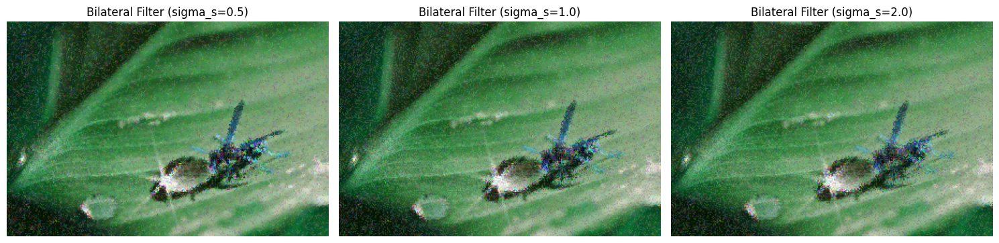

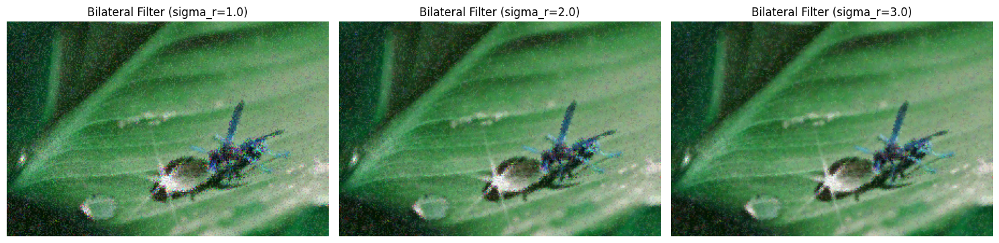

In [115]:
kernel_sizes = [3, 5, 7]
sigma_s = 1.0
sigma_r = 1.0
filtered_images_k = [bilaterFilter(img2, k=size, sigma_s=sigma_s, sigma_r=sigma_r) for size in kernel_sizes]
titles_k = [f'Bilateral Filter (k={size})' for size in kernel_sizes]
plot_images(filtered_images_k, titles_k)

sigma_s_values = [0.5, 1.0, 2.0]
k = 7
sigma_r = 1.0
filtered_images_sigma_s = [bilaterFilter(img2, k=k, sigma_s=sigma, sigma_r=sigma_r) for sigma in sigma_s_values]
titles_sigma_s = [f'Bilateral Filter (sigma_s={sigma})' for sigma in sigma_s_values]
plot_images(filtered_images_sigma_s, titles_sigma_s)

sigma_r_values = [1.0, 2.0, 3.0]
k = 7
sigma_s = 1.0
filtered_images_sigma_r = [bilaterFilter(img2, k=k, sigma_s=sigma_s, sigma_r=sigma) for sigma in sigma_r_values]
titles_sigma_r = [f'Bilateral Filter (sigma_r={sigma})' for sigma in sigma_r_values]
plot_images(filtered_images_sigma_r, titles_sigma_r)

**Observations**

**Effect of Kernel Size (k):**

**Small k:** The filter might retain more details but could introduce more noise, as it considers fewer neighboring pixels.

**Large k:**
The filter becomes smoother and can blur details more significantly as it considers a larger area, which may lead to loss of edges.

**Effect of Spatial Standard Deviation:**

**Small :**
The filter will have a sharper fall-off, leading to more localized effects, thus preserving edges.

**Large :**
The influence of distant pixels increases, which can lead to over-smoothing and loss of detail.

**Effect of Range Standard Deviation:**

**Small :**
The filter becomes more sensitive to intensity differences, which preserves edges and fine details better.

**Large :**
More pixels can contribute to the averaging, leading to a softer, more blended image that may lose significant features.

**Observations from Results Visual Differences:**

**Gaussian Filter:** The output may appear more blurred overall, with less distinction between different areas of the image, especially along edges.

**Bilateral Filter:** The output retains sharper edges and more detail, resulting in a cleaner appearance where features are discernible.
Noise Reduction:

Both filters reduce noise effectively, but the Gaussian filter does so uniformly, while the Bilateral filter selectively smooths areas with noise while preserving edges.
Parameter Sensitivity:

The Bilateral filter's results are more sensitive to the parameters
𝜎
𝑠
σ
s
​
  (spatial) and
𝜎
𝑟
σ
r
​
  (range). Choosing these values carefully can significantly affect the output quality, while the Gaussian filter primarily depends on the kernel size.

**Question 3: Edge of Glory**

In [116]:
img3_path = '/content/IMG3.jpeg'
img3 = read_image(img3_path)

In [117]:
img3_copy = np.copy(img3)

**3.1: Sobel Filter**

In [43]:
def sobelFilter(img):
    sobel_x = np.array([[-1, -2, -1],
                        [0, 0, 0],
                        [1, 2, 1]], dtype=np.float32)

    sobel_y = np.array([[ -1,  0,  1],
                        [ -2,  0,  2],
                        [-1, 0, 1]], dtype=np.float32)

    if img.ndim == 3:
        gradient_magnitude = np.zeros((img.shape[0], img.shape[1]), dtype=np.float32)

        for channel in range(img.shape[2]):
            gradient_x = fast_conv2D(img[..., channel], sobel_x)
            gradient_y = fast_conv2D(img[..., channel], sobel_y)
            gradient_magnitude += np.sqrt(gradient_x**2 + gradient_y**2)

    else:
        gradient_x = fast_conv2D(img, sobel_x)
        gradient_y = fast_conv2D(img, sobel_y)
        gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)

    gradient_magnitude = (gradient_magnitude / np.max(gradient_magnitude) * 255).astype(np.uint8)

    return gradient_magnitude

In [119]:
sobel_gradient_magnitude = sobelFilter(img3_copy)

**3.2: prewittFilter**

In [44]:
def prewittFilter(img):
    prewitt_x = np.array([[ -1, 0, 1],
                           [ -1, 0, 1],
                           [ -1, 0, 1]])

    prewitt_y = np.array([[ 1, 1, 1],
                           [ 0, 0, 0],
                           [ -1, -1, -1]])

    if img.ndim == 3:
        gradient_magnitude = np.zeros((img.shape[0], img.shape[1]), dtype=np.float32)
        for channel in range(img.shape[2]):
            gradient_x = fast_conv2D(img[..., channel], prewitt_x)
            gradient_y = fast_conv2D(img[..., channel], prewitt_y)
            gradient_magnitude += np.sqrt(gradient_x**2 + gradient_y**2)

        gradient_magnitude = (gradient_magnitude / np.max(gradient_magnitude) * 255).astype(np.uint8)

    else:
        gradient_x = fast_conv2D(img, prewitt_x)
        gradient_y = fast_conv2D(img, prewitt_y)
        gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)
        gradient_magnitude = (gradient_magnitude / np.max(gradient_magnitude) * 255).astype(np.uint8)

    return gradient_magnitude

In [121]:
prewitt_edge_magnitude = prewittFilter(img3_copy)

**3.3: roberts Filter**

In [45]:
def robertsFilter(img):
    roberts_x = np.array([[1, 0],
                          [0, -1]])

    roberts_y = np.array([[0, 1],
                          [-1, 0]])

    if img.ndim == 3:
        gradient_magnitude = np.zeros((img.shape[0], img.shape[1]), dtype=np.float32)

        for channel in range(img.shape[2]):
            gradient_x = fast_conv2D(img[..., channel], roberts_x)
            gradient_y = fast_conv2D(img[..., channel], roberts_y)
            gradient_magnitude += np.sqrt(gradient_x**2 + gradient_y**2)

        gradient_magnitude = (gradient_magnitude / np.max(gradient_magnitude) * 255).astype(np.uint8)

    else:
        gradient_x = fast_conv2D(img, roberts_x)
        gradient_y = fast_conv2D(img, roberts_y)
        gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)
        gradient_magnitude = (gradient_magnitude / np.max(gradient_magnitude) * 255).astype(np.uint8)

    return gradient_magnitude

In [123]:
roberts_edge_map = robertsFilter(img3_copy)

**3.4: Sub Plots**

In [124]:
def apply_filter_to_color_image(img, kernel_x, kernel_y):
    gradient_magnitude = np.zeros((img.shape[0], img.shape[1]), dtype=np.float32)

    for channel in range(img.shape[2]):
        gradient_x = fast_conv2D(img[..., channel], kernel_x)
        gradient_y = fast_conv2D(img[..., channel], kernel_y)
        gradient_magnitude += np.sqrt(gradient_x**2 + gradient_y**2)

    gradient_magnitude = (gradient_magnitude / np.max(gradient_magnitude) * 255).astype(np.uint8)

    return gradient_x, gradient_y, gradient_magnitude

In [125]:
def plot_gradients_and_edge_map(grad_x, grad_y, edge_map, title="Edge Detection"):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(grad_x, cmap='gray')
    plt.title(f'{title} - X Gradient')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(grad_y, cmap='gray')
    plt.title(f'{title} - Y Gradient')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(edge_map, cmap='gray')
    plt.title(f'{title} - Edge Map')
    plt.axis('off')

    plt.show()

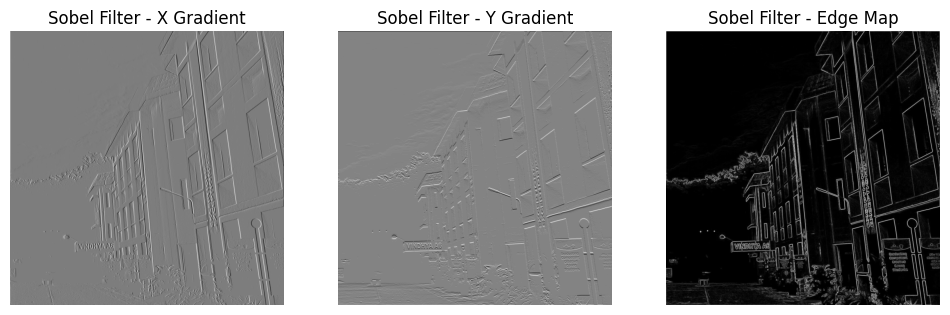

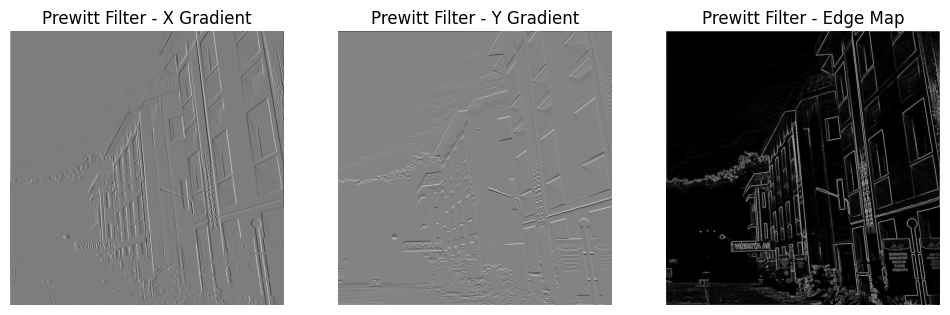

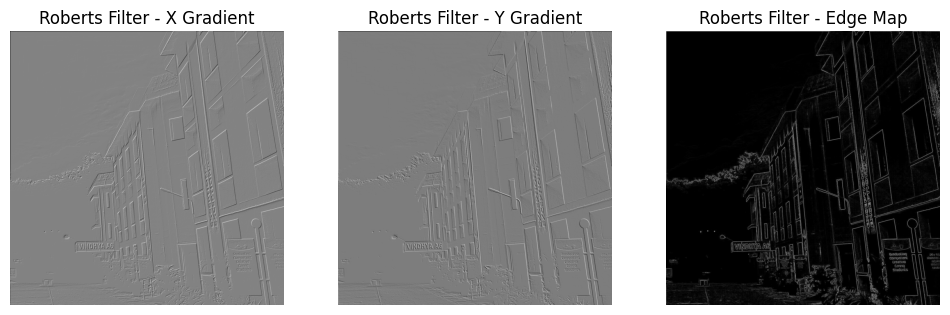

In [126]:
sobel_x = np.array([[ -1, 0, 1],
                    [ -2, 0, 2],
                    [ -1, 0, 1]])

sobel_y = np.array([[ 1, 2, 1],
                    [ 0, 0, 0],
                    [ -1, -2, -1]])

sobel_grad_x, sobel_grad_y, sobel_edge_map = apply_filter_to_color_image(img3_copy, sobel_x, sobel_y)
plot_gradients_and_edge_map(sobel_grad_x, sobel_grad_y, sobel_edge_map, title="Sobel Filter")

prewitt_x = np.array([[ -1, 0, 1],
                      [ -1, 0, 1],
                      [ -1, 0, 1]])

prewitt_y = np.array([[ 1, 1, 1],
                      [ 0, 0, 0],
                      [ -1, -1, -1]])

prewitt_grad_x, prewitt_grad_y, prewitt_edge_map = apply_filter_to_color_image(img3_copy, prewitt_x, prewitt_y)
plot_gradients_and_edge_map(prewitt_grad_x, prewitt_grad_y, prewitt_edge_map, title="Prewitt Filter")

roberts_x = np.array([[1, 0],
                      [0, -1]])

roberts_y = np.array([[0, 1],
                      [-1, 0]])

roberts_grad_x, roberts_grad_y, roberts_edge_map = apply_filter_to_color_image(img3_copy, roberts_x, roberts_y)
plot_gradients_and_edge_map(roberts_grad_x, roberts_grad_y, roberts_edge_map, title="Roberts Filter")


**3.5: Laplacian Filter**

In [127]:
def laplacianFilter(img, k=3):
    if k == 3:
        laplacian_kernel = np.array([[0, 1, 0],
                                     [1, -4, 1],
                                     [0, 1, 0]])
    elif k == 5:
        laplacian_kernel = np.array([[0, 0, 1, 0, 0],
                                     [0, 1, 2, 1, 0],
                                     [1, 2, -16, 2, 1],
                                     [0, 1, 2, 1, 0],
                                     [0, 0, 1, 0, 0]])
    elif k == 7:
        laplacian_kernel = np.array([[0, 0, 0, 1, 0, 0, 0],
                                     [0, 1, 3, 5, 3, 1, 0],
                                     [0, 3, 5, -12, 5, 3, 0],
                                     [1, 5, -12, -24, -12, 5, 1],
                                     [0, 3, 5, -12, 5, 3, 0],
                                     [0, 1, 3, 5, 3, 1, 0],
                                     [0, 0, 0, 1, 0, 0, 0]])

    if img.ndim == 3:
        filtered_image = np.zeros((img.shape[0], img.shape[1]), dtype=np.float32)

        for channel in range(img.shape[2]):
            filtered_image += fast_conv2D(img[..., channel], laplacian_kernel)

        filtered_image = (filtered_image / np.max(filtered_image) * 255).astype(np.uint8)

    else:
        filtered_image = fast_conv2D(img, laplacian_kernel)
        filtered_image = (filtered_image / np.max(filtered_image) * 255).astype(np.uint8)

    return filtered_image

In [128]:
def plot_laplacian_results(img, kernel_sizes):
    plt.figure(figsize=(12, 4))
    for i, k in enumerate(kernel_sizes):
        laplacian_filtered_img = laplacianFilter(img, k)
        plt.subplot(1, len(kernel_sizes), i+1)
        plt.imshow(laplacian_filtered_img, cmap='gray')
        plt.title(f'Laplacian Filter (k={k})')
        plt.axis('off')

    plt.show()

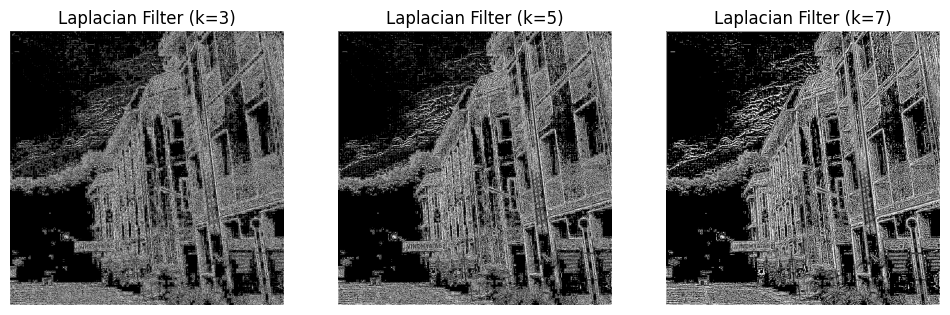

In [129]:
kernel_sizes = [3, 5, 7]
plot_laplacian_results(img3_copy, kernel_sizes)

**3.6: Analysis**

**Filter Analysis and Edge Identification**

**Sobel Filter:**

**Description:** The Sobel filter is a first-order derivative filter that calculates the gradient in both the horizontal and vertical directions using convolution with Sobel kernels.

**Edge Detection:**
The Sobel filter is excellent at detecting strong edges where there are abrupt intensity changes.
It is particularly good for identifying diagonal edges and smooth transitions between different areas of the image.
Sobel is less sensitive to noise, thanks to the smoothing effect it has by averaging over a 3x3 kernel.

**Best For:**
Strong, smooth edges in images.
Diagonally oriented edges, such as lines and boundaries between contrasting regions.

**Prewitt Filter:**

**Description:** Similar to the Sobel filter, but uses a simpler kernel. It’s a gradient-based filter used to identify horizontal and vertical edges.

**Edge Detection:**
The Prewitt filter provides similar edge detection to Sobel but does less smoothing due to its simpler kernels.
It can detect sharp changes in intensity, especially for horizontal and vertical edges.
It’s more sensitive to noise compared to Sobel, as it does less averaging.

**Best For:**
Sharp horizontal and vertical edges where details are more prominent.
Suitable for images where fine structures are important, but noise may be a concern.

**Roberts Filter:**

**Description:** The Roberts filter computes the gradient using a 2x2 kernel, focusing on the nearest neighbors. It detects edges at pixel-level resolution.

**Edge Detection:**
The Roberts operator is highly sensitive to small, fine details and abrupt intensity changes.
It is excellent at detecting sharp, fine edges, but because of the small kernel, it’s also very sensitive to noise.
It works well on high-resolution images with sharp transitions, but it can lead to noisy results in low-contrast images.

**Best For:**
Small, high-detail edges, such as thin lines and small-scale objects.
Images with clear, sharp boundaries but can suffer in the presence of noise.

**Laplacian Filter:**

**Description:** The Laplacian filter is a second-order derivative filter that emphasizes areas of rapid intensity change.

**Edge Detection:**
The Laplacian detects edges and fine details well, particularly in areas where there are rapid changes in intensity.
It captures all orientations of edges (horizontal, vertical, and diagonal) equally well.
Because it’s a second-order derivative, it is more sensitive to noise than Sobel or Prewitt.

**Best For:**
All-directional edge detection, capturing both fine details and broader transitions.
Best used on noisy images with some form of noise reduction (e.g., Gaussian smoothing before applying).

**Question 4: Sharpen Up**

In [8]:
img4_path = '/content/IMG4.png'
img4 = read_image(img4_path)

In [9]:
img4_copy = np.copy(img4)

Function to find gaussian kernel

In [10]:
def gaussian_kernel(k, sigma):
    assert k % 2 == 1, "Kernel size must be odd."
    ax = np.arange(-(k // 2), k // 2 + 1)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))
    kernel = kernel / np.sum(kernel)
    return kernel

Function to apply gaussian blurr into an image

In [11]:
def apply_gaussian_blur(img, k, sigma):
    kernel = gaussian_kernel(k, sigma)
    blurred_img = fast_conv2D(img, kernel)
    return blurred_img

**4.1: UnsharpMask Function**

In [12]:
def unsharpMask(img, k, sigma):
    if len(img.shape) == 3 and img.shape[2] == 3:
        r, g, b = img[:, :, 0], img[:, :, 1], img[:, :, 2]
        r_sharp = r + (r - apply_gaussian_blur(r, k, sigma))
        g_sharp = g + (g - apply_gaussian_blur(g, k, sigma))
        b_sharp = b + (b - apply_gaussian_blur(b, k, sigma))
        sharp_img = np.stack([np.clip(r_sharp, 0, 255),
                              np.clip(g_sharp, 0, 255),
                              np.clip(b_sharp, 0, 255)], axis=2).astype(np.uint8)
    else:
        blurred = apply_gaussian_blur(img, k, sigma)
        sharp_img = img + (img - blurred)
        sharp_img = np.clip(sharp_img, 0, 255).astype(np.uint8)

    return sharp_img

Applying unsharp mask on img4

In [15]:
sharpened_img = unsharpMask(img4_copy, k=5, sigma=1.0)

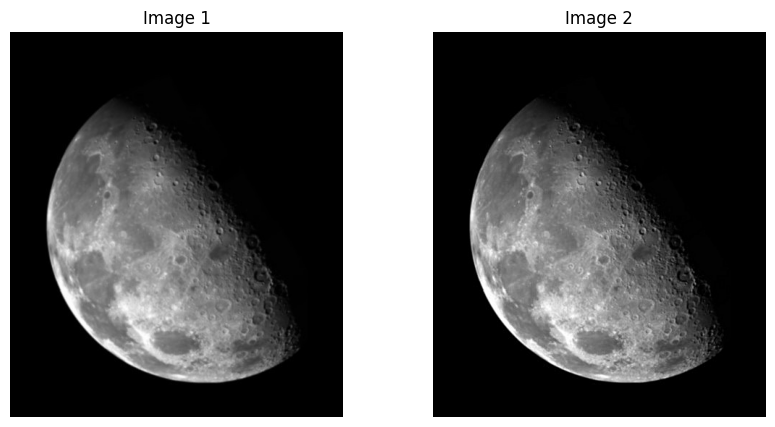

In [16]:
plot_two_images(img4_copy,sharpened_img)

**4.2: Results on varying kernel size and standard deviation**

In [18]:
def apply_unsharp_mask_with_different_params(img, k_values, sigma_values):
  for k in k_values:
        for sigma in sigma_values:
            sharpened_img = unsharpMask(img, k=k, sigma=sigma)
            plot_two_images(img, sharpened_img,
                            title1="Original Image",
                            title2=f"Sharpened Image (k={k}, σ={sigma})")

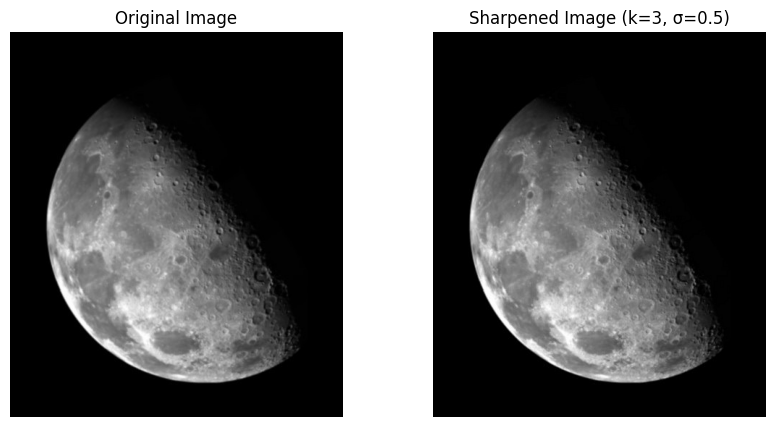

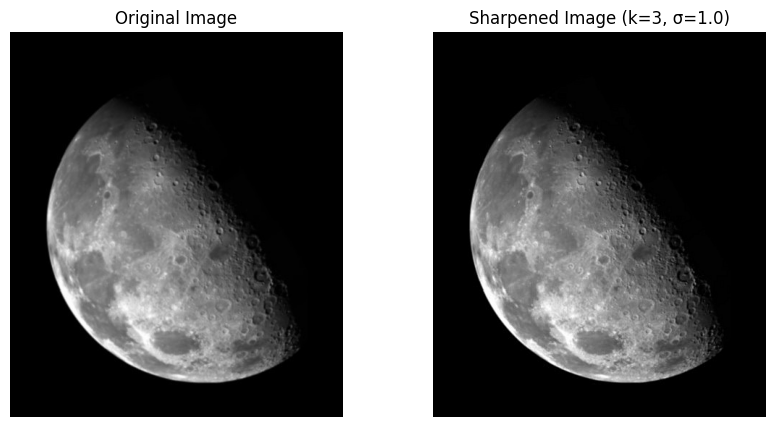

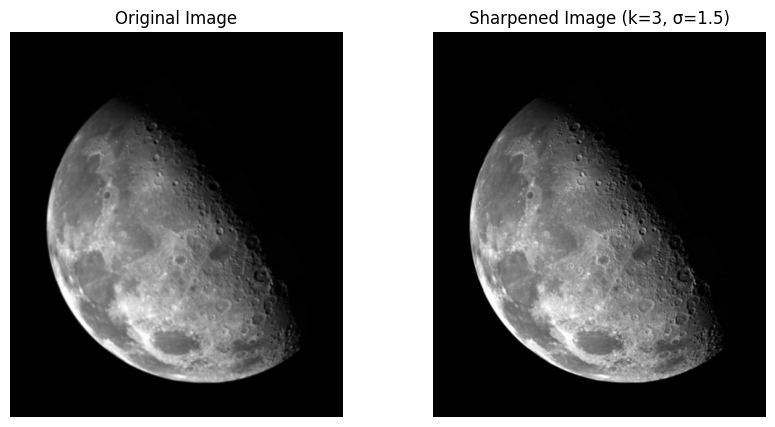

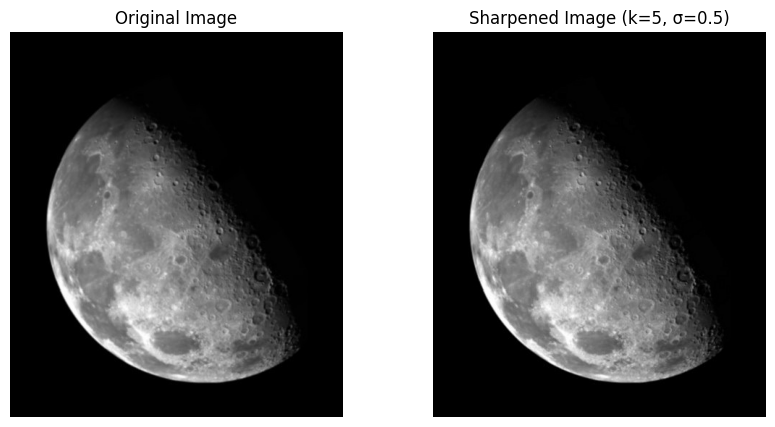

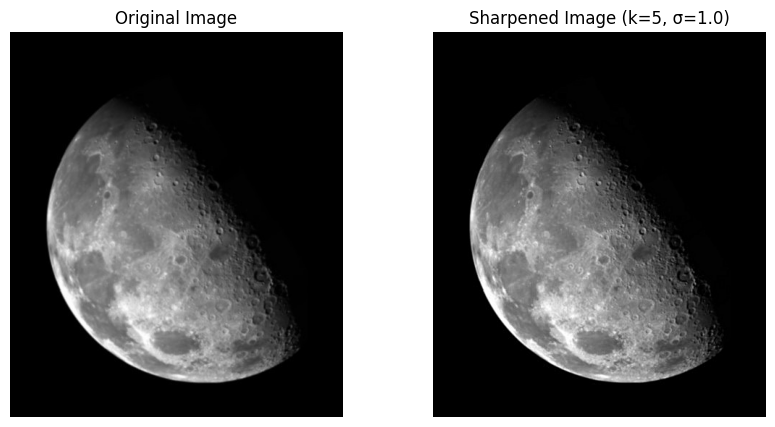

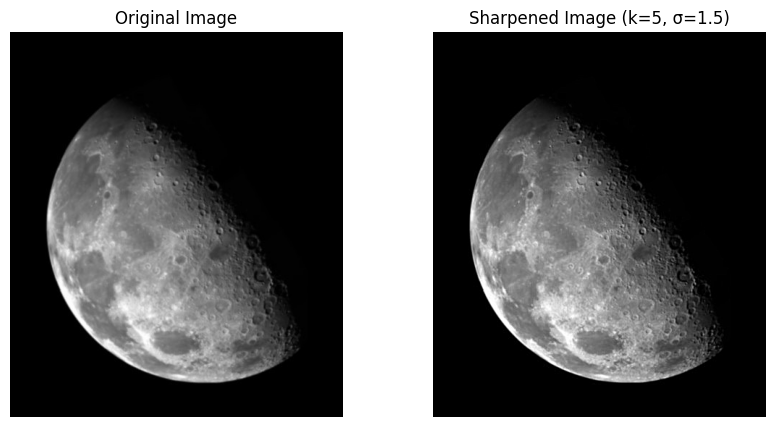

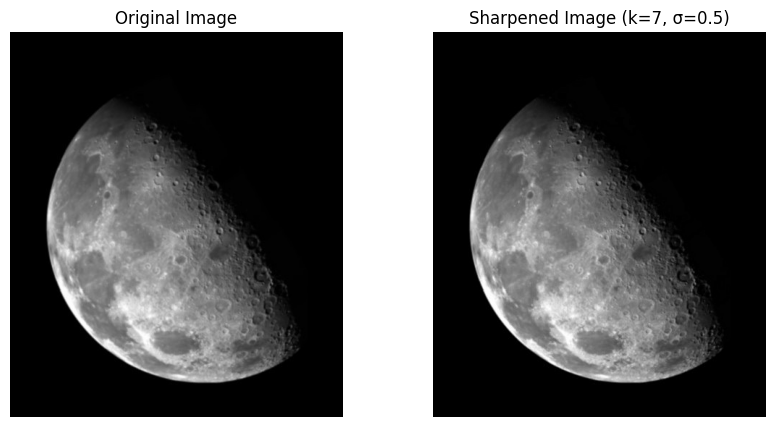

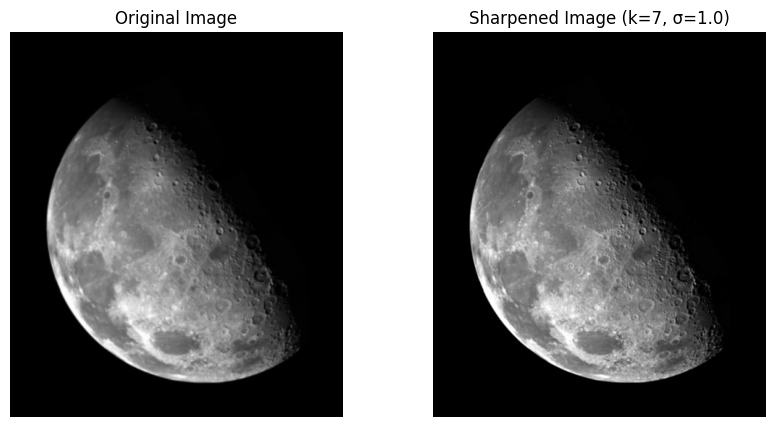

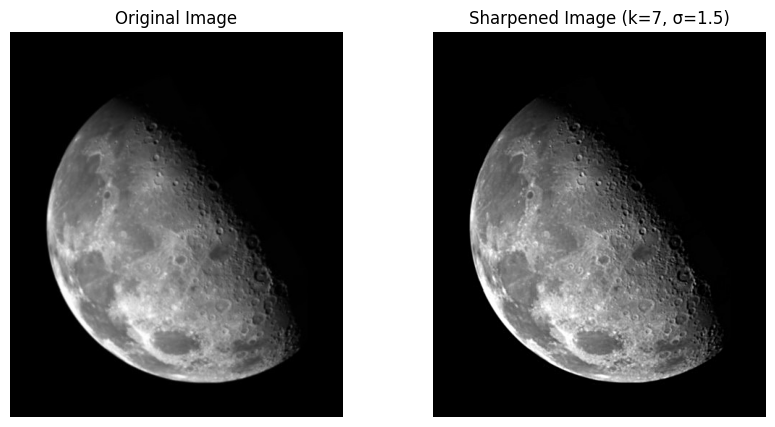

In [19]:
k_values = [3, 5, 7]
sigma_values = [0.5, 1.0, 1.5]

apply_unsharp_mask_with_different_params(img4_copy, k_values, sigma_values)

Comment on the Effect of k and σ:
Kernel Size (k):

**Small kernel (k=3):** This will sharpen finer details and smaller edges because the Gaussian blur affects a smaller region around each pixel. The sharpening effect will be more localized and pronounced for small-scale structures.

**Larger kernel (k=7):** As the kernel size increases, the Gaussian blur becomes more spread out, leading to a softer overall image. The sharpening effect will focus on larger features and might miss finer details, giving a more gradual enhancement.
Standard Deviation (σ):

**Small σ (e.g., σ=0.5):** This results in less blur, leading to stronger sharpening of finer details and edges. However, this might also introduce noise and artifacts.

**Larger σ (e.g., σ=1.5):** As σ increases, the blur becomes stronger, smoothing out the image more before sharpening. This leads to a more subtle sharpening effect, and it might focus on larger structures while suppressing noise and small-scale variations.
General Observations:
Higher k and higher σ will result in a subtler sharpening effect, useful for enhancing larger features while avoiding noise amplification.
Lower k and lower σ will produce a stronger sharpening effect, but can also make the image look unnatural by enhancing small details and noise.

**4.3: HighBoost Filter**

In [20]:
def highboostFilter(img, k, sigma, A):
    if len(img.shape) == 3 and img.shape[2] == 3:
        r, g, b = img[:, :, 0], img[:, :, 1], img[:, :, 2]

        r_boost = A * r - apply_gaussian_blur(r, k, sigma)
        g_boost = A * g - apply_gaussian_blur(g, k, sigma)
        b_boost = A * b - apply_gaussian_blur(b, k, sigma)

        highboost_img = np.stack([np.clip(r_boost, 0, 255),
                                  np.clip(g_boost, 0, 255),
                                  np.clip(b_boost, 0, 255)], axis=2).astype(np.uint8)
    else:
        blurred = apply_gaussian_blur(img, k, sigma)
        highboost_img = A * img - blurred
        highboost_img = np.clip(highboost_img, 0, 255).astype(np.uint8)

    return highboost_img

In [21]:
k = 5
sigma = 1.0
A = 2.0

highboost_img = highboostFilter(img4_copy, k, sigma, A)

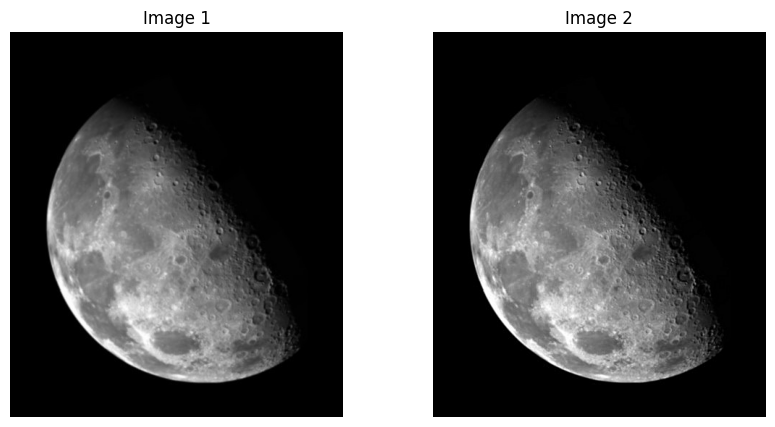

In [22]:
plot_two_images(img4_copy, highboost_img)

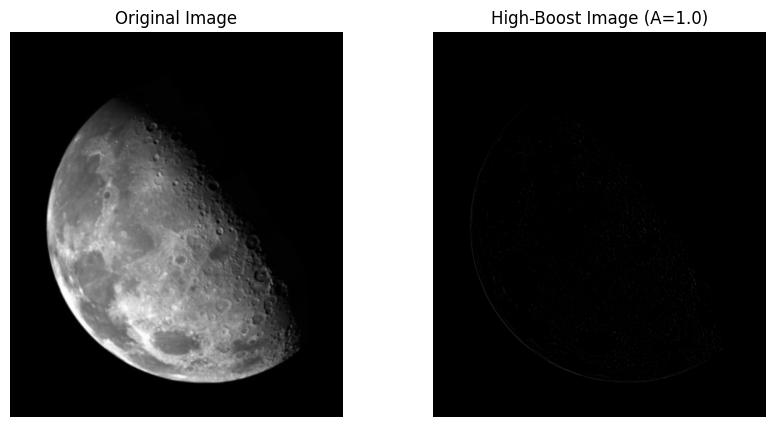

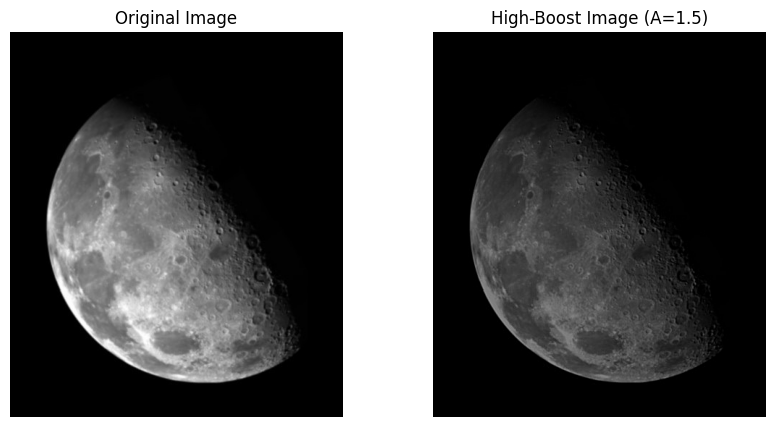

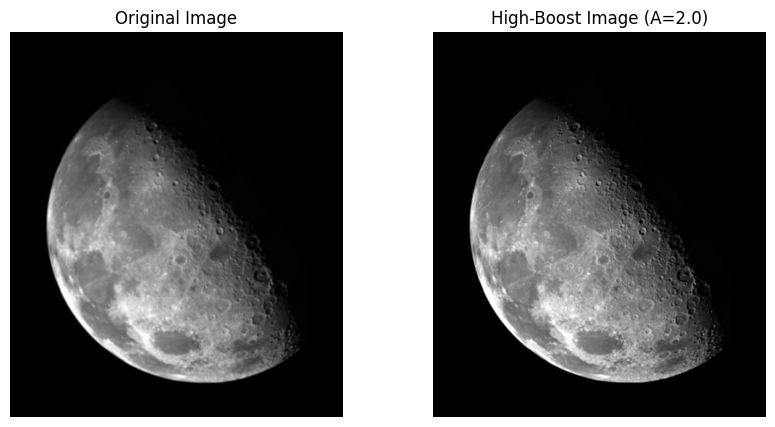

In [23]:
k = 5
sigma = 1.0
A_values = [1.0, 1.5, 2.0]

for A in A_values:
    highboost_img = highboostFilter(img4, k, sigma, A)

    plot_two_images(img4_copy, highboost_img, title1='Original Image', title2=f'High-Boost Image (A={A})')

Comment on the Effect of Different A Values:
A = 1.0 (Unsharp Masking):

The image will have edges and details enhanced, but the sharpening effect is relatively subtle. You are only subtracting the blurred image from the original without adding additional weight to the original image. This is equivalent to a traditional unsharp mask.
A = 1.5 (Moderate High-Boost):

The original image is now amplified by a factor of 1.5, so the details and edges become more prominent than in the case of A = 1.0. The overall sharpness of the image increases, but the enhancement still looks natural.
A = 2.0 (Strong High-Boost):

In this case, the original image is boosted more strongly. The edges and fine details will become highly pronounced, making the image look much sharper. However, if A is too high, it can introduce artifacts, enhance noise, and make the image look unnatural or over-sharpened.
General Observations:
As A increases, the sharpness of the image increases significantly. You can clearly see more definition around edges and high-frequency details like textures.
Larger values of A will enhance contrast around edges but may also amplify noise and small imperfections in the image.
For typical image enhancement, values of A between 1.0 and 2.0 provide a good balance between enhancing details and keeping the image natural.
Conclusion:
A = 1 gives you unsharp masking, which provides a subtle edge enhancement.
A = 1.5 moderately enhances sharpness without making the image look too artificial.
A = 2 creates a more aggressive sharpening effect, bringing out more detail, but at the risk of over-sharpening and amplifying noise.

**4.4: Plots for original image, unsharp masked image and the highboost filtered image**

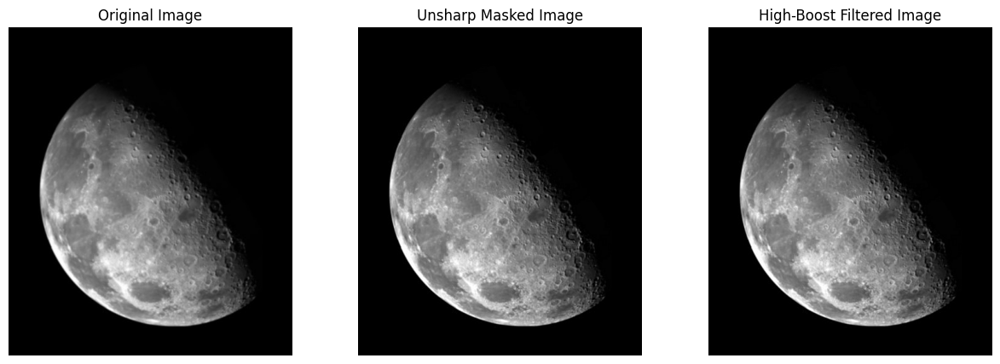

In [24]:
k = 5
sigma = 1.0
A = 2.0

unsharp_masked_img = unsharpMask(img4_copy, k, sigma)
highboost_img = highboostFilter(img4_copy, k, sigma, A)

def plot_three_images(img1, img2, img3, title1="Original Image", title2="Unsharp Masked Image", title3="High-Boost Filtered Image"):
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(img1)
    plt.title(title1)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(img2)
    plt.title(title2)
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(img3)
    plt.title(title3)
    plt.axis('off')

    plt.show()

plot_three_images(img4, unsharp_masked_img, highboost_img)

Comparison of Results:
After running the above code, you'll observe the following:

**Original Image:** Displays the base image without any enhancements.

**Unsharp Masked Image:** Shows the effects of the unsharp masking technique, which enhances edges and fine details without significantly increasing the overall contrast.

**High-Boost Filtered Image:** Displays a more aggressive enhancement of edges and fine details due to the application of the high-boost filter. Depending on the boost factor A, this image might reveal more texture and sharpness than the unsharp masked image.
Conclusion:

**Unsharp Masking:** Generally provides a more natural enhancement and is effective for applications where subtlety is preferred.

**High-Boost Filtering:** Can yield more pronounced results, making fine details much more prominent. However, if the boost factor A is too high, it may introduce noise and artifacts.
Ultimately, the choice between the two methods depends on the specific application and the desired outcome. High-boost filtering can enhance details more aggressively but may risk over-sharpening, while unsharp masking offers a more balanced enhancement.

**Question 5: Rain Rain Go Away**

**5.1**

In [25]:
img5_path = '/content/IMG5.jpg'
img5 = read_image(img5_path)

In [26]:
img5_copy = np.copy(img5)

In [27]:
def apply_filters(img):
    mean_k = 5
    median_k = 7
    gauss_k = 7
    gauss_sigma = 1.5
    bilat_k = 9
    bilat_sigma_s = 2.0
    bilat_sigma_r = 1.5

    filtered_mean = meanFilter(img, k=mean_k)
    filtered_median = medianFilter(img, k=median_k)
    filtered_gauss = gaussFilter(img, k=gauss_k, sigma=gauss_sigma)
    filtered_bilateral = bilaterFilter(img, k=bilat_k, sigma_s=bilat_sigma_s, sigma_r=bilat_sigma_r)

    return filtered_mean, filtered_median, filtered_gauss, filtered_bilateral

In [28]:
def display_results(original, mean_filtered, median_filtered, gauss_filtered, bilateral_filtered):
    plt.figure(figsize=(12, 10))

    plt.subplot(2, 2, 1)
    plt.imshow(original)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.imshow(mean_filtered)
    plt.title('Mean Filtered')
    plt.axis('off')

    plt.subplot(2, 2, 3)
    plt.imshow(median_filtered)
    plt.title('Median Filtered')
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.imshow(gauss_filtered)
    plt.title('Gaussian Filtered')
    plt.axis('off')

    plt.figure(figsize=(6, 5))
    plt.imshow(bilateral_filtered)
    plt.title('Bilateral Filtered')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

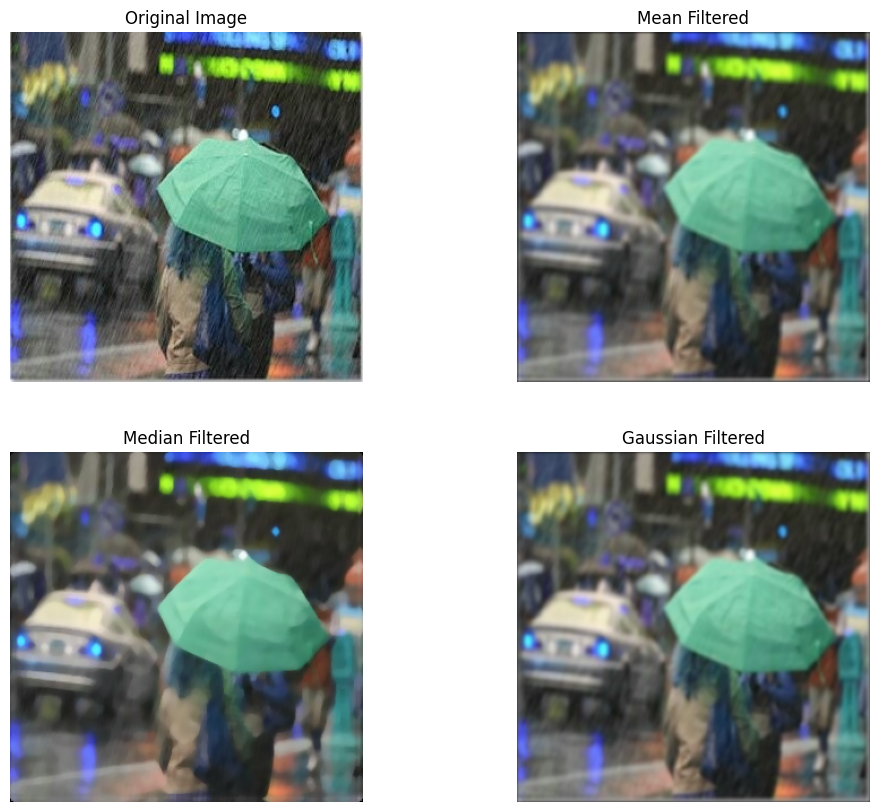

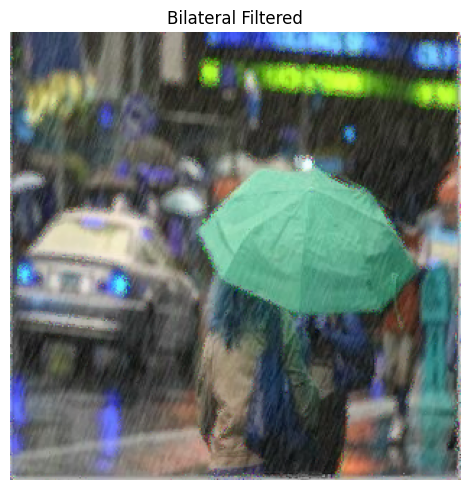

In [46]:
mean_filtered, median_filtered, gauss_filtered, bilateral_filtered = apply_filters(img5_copy)
display_results(img5_copy, mean_filtered, median_filtered, gauss_filtered, bilateral_filtered)

**5.2**

In [47]:
img6_path = '/content/IMG6.png'
img6 = read_image(img6_path)

In [48]:
img6_copy = np.copy(img6)

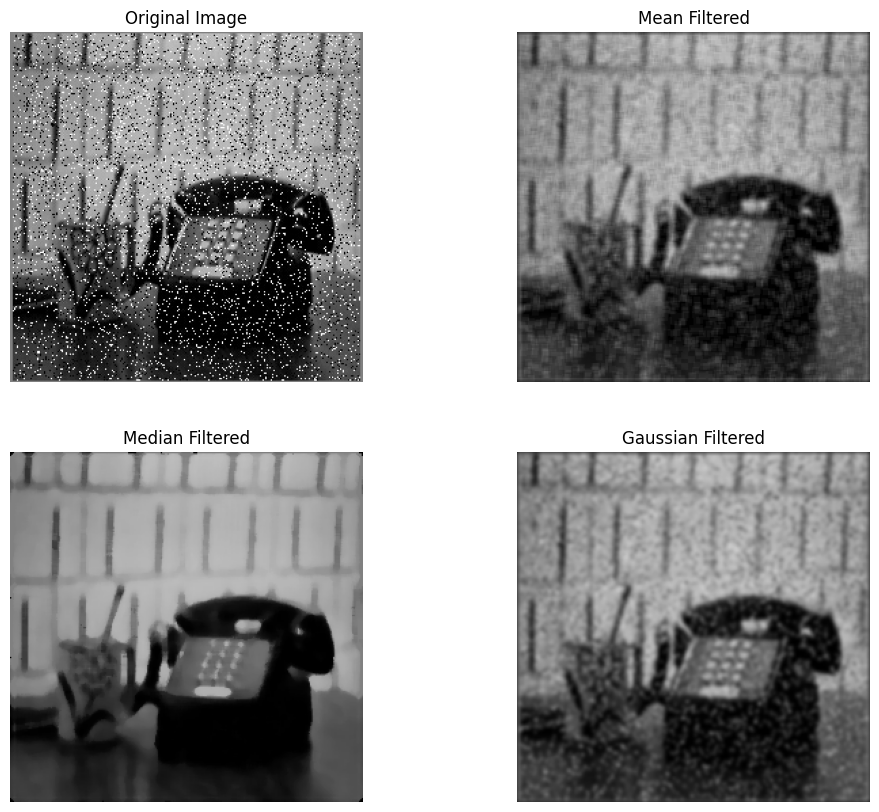

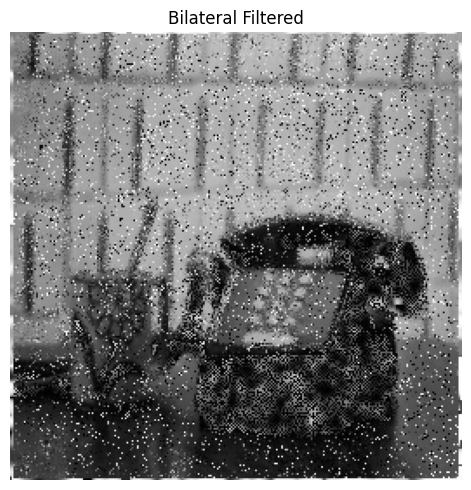

In [49]:
mean_filtered_img6, median_filtered_img6, gauss_filtered_img6, bilateral_filtered_img6 = apply_filters(img6_copy)
display_results(img6, mean_filtered_img6, median_filtered_img6, gauss_filtered_img6, bilateral_filtered_img6)

**Question 6: Transform and Conquer**

**6a.1**

In [50]:
img7_path = '/content/IMG7.jpg'
img7 = read_image(img7_path,0)

In [51]:
img7_copy = np.copy(img7)

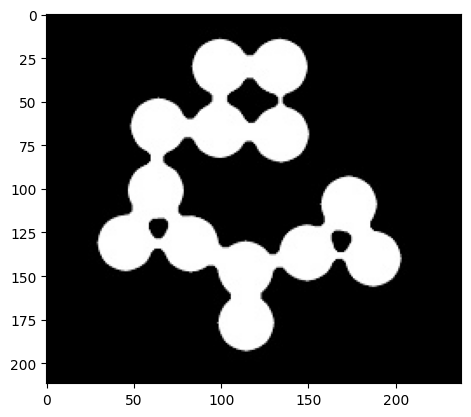

In [52]:
display_image(img7_copy)

In [53]:
def generate_disk_kernel(radius):
    diameter = 2 * radius + 1
    disk_kernel = np.zeros((diameter, diameter), dtype=np.uint8)

    center = radius

    for i in range(diameter):
        for j in range(diameter):
            if np.sqrt((i - center) ** 2 + (j - center) ** 2) <= radius:
                disk_kernel[i, j] = 1

    return disk_kernel

disk_kernel = generate_disk_kernel(radius=15)

# print(disk_kernel)

In [54]:
def erosion(binary_image, kernel):
    img_copy = np.pad(binary_image, pad_width=((kernel.shape[0]//2, kernel.shape[0]//2),
                                               (kernel.shape[1]//2, kernel.shape[1]//2)),
                      mode='constant', constant_values=0)
    eroded_image = np.zeros_like(binary_image)

    for i in range(eroded_image.shape[0]):
        for j in range(eroded_image.shape[1]):
            region = img_copy[i:i + kernel.shape[0], j:j + kernel.shape[1]]
            if np.all(region[kernel == 1] == 1):
                eroded_image[i, j] = 1
            else:
                eroded_image[i, j] = 0

    return eroded_image


In [56]:
def dilation(binary_image, kernel):
    img_copy = np.pad(binary_image, pad_width=((kernel.shape[0]//2, kernel.shape[0]//2),
                                               (kernel.shape[1]//2, kernel.shape[1]//2)),
                      mode='constant', constant_values=0)
    dilated_image = np.zeros_like(binary_image)

    for i in range(dilated_image.shape[0]):
        for j in range(dilated_image.shape[1]):
            region = img_copy[i:i + kernel.shape[0], j:j + kernel.shape[1]]
            if np.any(region[kernel == 1] == 1):
                dilated_image[i, j] = 1

    return dilated_image

In [59]:
binary_image = (img7_copy > 128).astype(np.uint8)
eroded_image = erosion(binary_image, disk_kernel)
separated_image = dilation(eroded_image, disk_kernel)

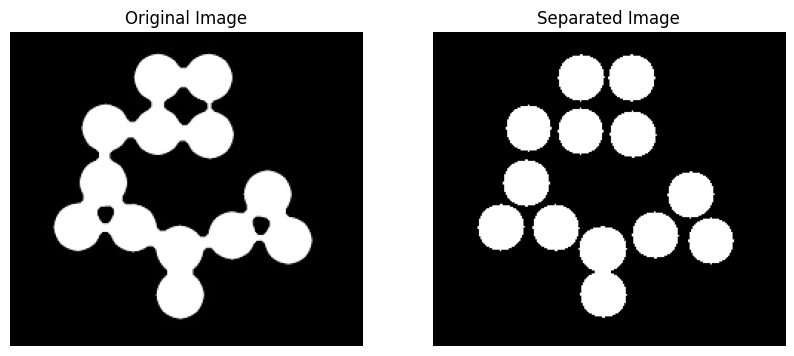

In [68]:
plot_two_images(img7_copy, separated_image, title1 = 'Original Image', title2 = 'Separated Image')

**6b**

In [127]:
def skeletonize_signature(img):
    binary = np.where(img > 127, 0, 255).astype(np.uint8)
    skeleton = np.zeros_like(binary, dtype=np.uint8)
    struct_elem = generate_disk_kernel(radius=1)

    while True:
        eroded = erosion(binary, struct_elem)
        dilated = dilation(eroded, struct_elem)
        temp = (binary - dilated).clip(min=0).astype(np.uint8)
        skeleton = np.maximum(skeleton, temp).astype(np.uint8)
        binary = eroded.copy().astype(np.uint8)

        if np.sum(binary) == 0:
            break

    return skeleton

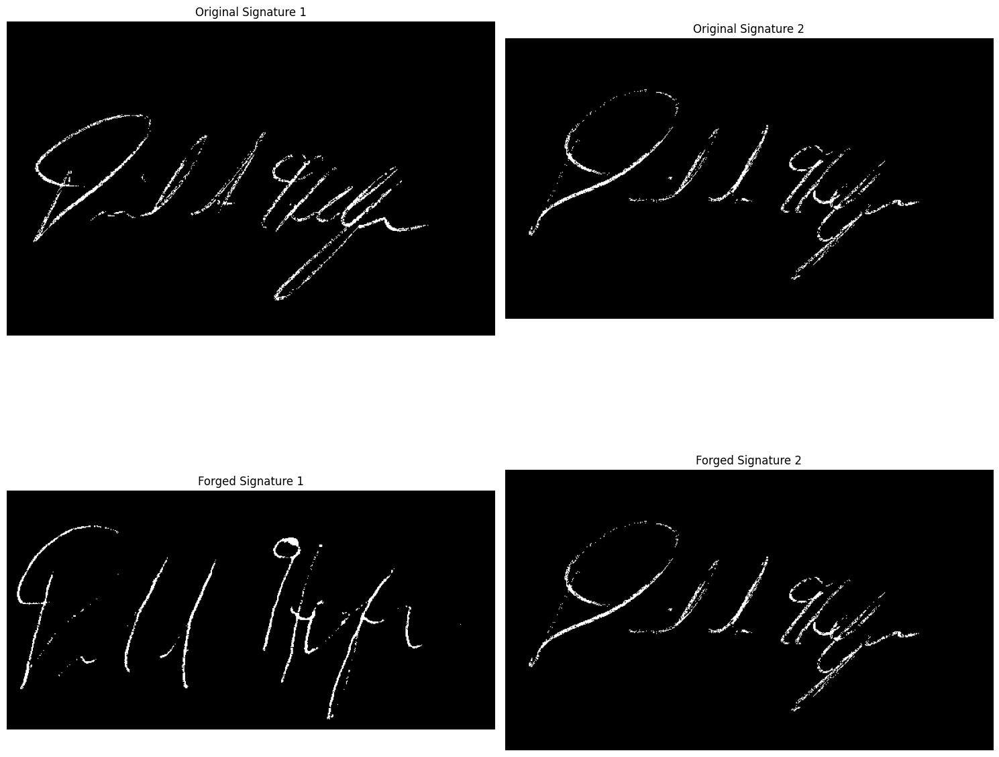

In [128]:
f_10_16_path = '/content/forgeries_10_16.png'
f_10_17_path = '/content/forgeries_10_17.png'
o_10_16_path = '/content/original_10_16.png'
o_10_17_path = '/content/original_10_17.png'

f_10_16_img = read_image(f_10_16_path,0)
f_10_17_img = read_image(f_10_17_path,0)
o_10_16_img = read_image(o_10_16_path,0)
o_10_17_img = read_image(o_10_17_path,0)

skeleton1 = skeletonize_signature(o_10_16_img)
skeleton2 = skeletonize_signature(o_10_17_img)
skeleton3 = skeletonize_signature(f_10_16_img)
skeleton4 = skeletonize_signature(o_10_17_img)

plt.figure(figsize=(15, 15))

plt.subplot(2, 2, 1)
plt.title('Original Signature 1')
plt.imshow(skeleton1, cmap='gray')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.title('Original Signature 2')
plt.imshow(skeleton2, cmap='gray')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.title('Forged Signature 1')
plt.imshow(skeleton3, cmap='gray')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.title('Forged Signature 2')
plt.imshow(skeleton4, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

**Question 7: Body scan Enhancement**

**Method 1**

In [69]:
img8_path = '/content/IMG8.png'
img8 = read_image(img8_path,0)

In [70]:
img8_copy = np.copy(img8)

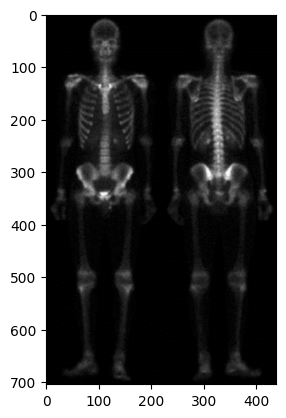

In [76]:
display_image(img8_copy)

In [103]:
def laplacian_Filter(img, k=3):
    laplacian_kernel = np.array([[-1, -1, -1],
                                 [-1,  8, -1],
                                 [-1, -1, -1]])

    filtered_image = fast_conv2D(img, laplacian_kernel)

    return filtered_image

In [104]:
laplacian_img = laplacian_Filter(img8_copy)

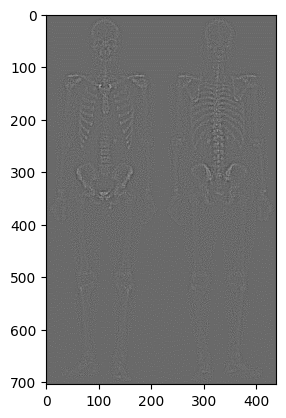

In [105]:
display_image(laplacian_img,0)

In [106]:
sharpened_img = img8_copy + laplacian_img

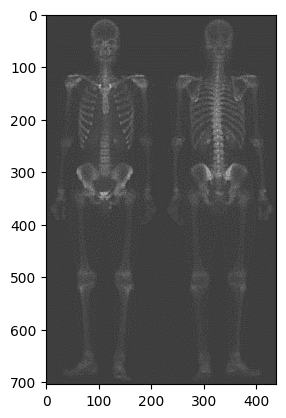

In [107]:
display_image(sharpened_img,0)

**Method 2**

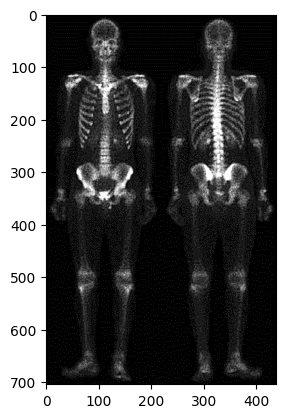

In [129]:
g_img = apply_gaussian_blur(img8,7,2.5)
g_img = highboostFilter(img8,7,2,2.5)
s_img = unsharpMask(g_img,7,2)


def contrast_adjustment(image):
    if len(image.shape) == 2:
        equalized_image = cv2.equalizeHist(image)
    else:
        ycrcb_img = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)
        ycrcb_img[:, :, 0] = cv2.equalizeHist(ycrcb_img[:, :, 0])
        equalized_image = cv2.cvtColor(ycrcb_img, cv2.COLOR_YCrCb2BGR)

    return equalized_image

eq_img = contrast_adjustment(s_img)

display_image(s_img)

**Question 8: You can't see me**

In [136]:
img9_path = '/content/IMG9.jpg'
img9 = read_image(img9_path)

In [137]:
median_filtered = medianFilter(img9,5)
gaussian_filtered = gaussFilter(median_filtered)
bilateral_filtered = bilaterFilter(median_filtered)

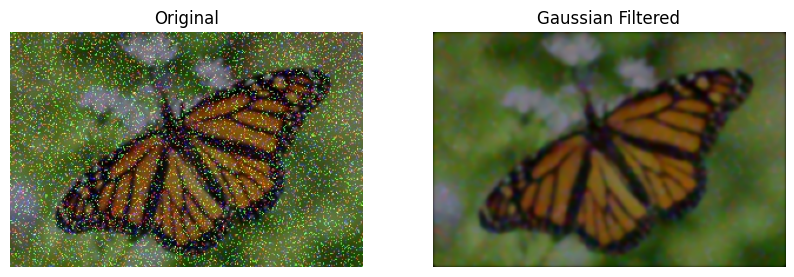

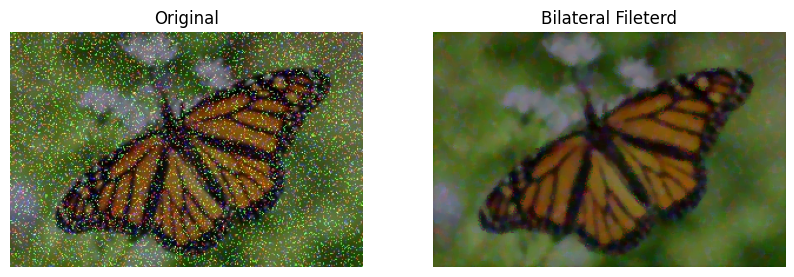

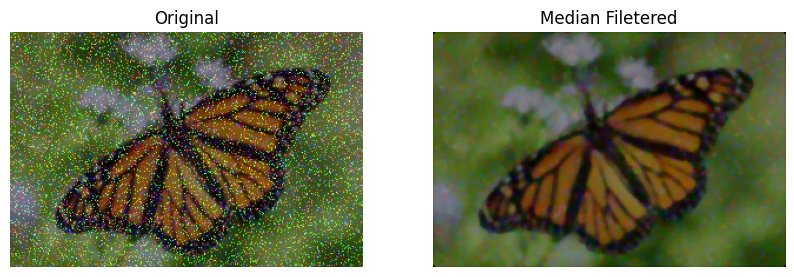

In [139]:
plot_two_images(img9, gaussian_filtered, title1='Original', title2='Gaussian Filtered')
plot_two_images(img9, bilateral_filtered, title1='Original', title2='Bilateral Fileterd')
plot_two_images(img9, median_filtered, title1='Original', title2='Median Filetered')